In [ ]:
from google.colab import drive
drive.mount ('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pandas

In [ ]:
!pip install pandas matplotlib seaborn scikit-learn

In [ ]:
# Importamos dependencias
import pandas as pd
import numpy as np

In [ ]:
# URL del archivo CSV
url = "https://raw.githubusercontent.com/marialuz1982/M1000IA/main/IA%20FAKEXPERT/data/processed/combined_data_FINAL%20(3).csv"

# Mostrar las primeras filas del dataset
FakeXpert.head()



,title,text,agency,subject,date,label,preprocessed_text,keywords,sentiment,topic,label_true,label_false
0,The frequent-flyer U.S. Congress: lawmakers wo...,Anyone seeking a table at Carmine s Italian r...,WASHINGTON (Reuters),politicsNews,2016-02-01,True,"[anyone, seeking, table, carmine, italian, res...","[anyone, seeking, table, carmine, italian, res...",0.061704,0,False,False
1,Pennsylvania Democrats raise concerns over CP'...,Democrats from Pennsylvania s congressional d...,CHICAGO (Reuters),politicsNews,2016-02-01,True,"[democrat, pennsylvania, congressional, delega...","[democrats, pennsylvania, congressional, deleg...",0.020000,2,False,False
2,Outside campaign groups lag U.S. presidential ...,"In 2015, it wasn t the new breed of political...","DES MOINES, Iowa (Reuters)",politicsNews,2016-02-01,True,"[2015, new, breed, political, group, raise, mu...","[2015, new, breed, political, groups, raise, m...",0.097491,1,False,False
3,Minnesota Governor Dayton released from hospit...,Minnesota Governor Mark Dayton was released on...,(Reuters),politicsNews,2016-02-01,True,"[minnesota, governor, mark, dayton, released, ...","[minnesota, governor, mark, dayton, released, ...",0.575000,1,False,False
4,Obama likely to discuss TPP Puerto Rico with R...,President Barack Obama is likely to discuss a ...,WASHINGTON (Reuters),politicsNews,2016-02-01,True,"[president, barack, obama, likely, discus, ran...","[president, barack, obama, likely, discuss, ra...",0.000000,3,False,False


In [ ]:
# Información general del dataset
FakeXpert.info()

# Resumen estadístico de las variables numéricas
FakeXpert.describe()

# Conteo de valores faltantes por columna
FakeXpert.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38756 entries, 0 to 38755
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   title              38756 non-null  object 
 1   text               38756 non-null  object 
 2   agency             38756 non-null  object 
 3   subject            38756 non-null  object 
 4   date               38756 non-null  object 
 5   label              38756 non-null  object 
 6   preprocessed_text  38756 non-null  object 
 7   keywords           38756 non-null  object 
 8   sentiment          38756 non-null  float64
 9   topic              38756 non-null  int64  
 10  label_true         38756 non-null  bool   
 11  label_false        38756 non-null  bool   
dtypes: bool(2), float64(1), int64(1), object(8)
memory usage: 3.0+ MB


title                0
text                 0
agency               0
subject              0
date                 0
label                0
preprocessed_text    0
keywords             0
sentiment            0
topic                0
label_true           0
label_false          0
dtype: int64

In [ ]:
#CONVERTIR DATE EN DATO NUMERICO
FakeXpert['date'] = pd.to_datetime(FakeXpert['date'])


1 -INFORMACION GENERAL DEL DATASET

In [ ]:
# Información general del dataset
FakeXpert.info()

# Resumen estadístico de las variables numéricas
FakeXpert.describe()

# Conteo de valores faltantes por columna
FakeXpert.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 38756 entries, 0 to 38755
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   title              38756 non-null  object        
 1   text               38756 non-null  object        
 2   agency             38756 non-null  object        
 3   subject            38756 non-null  object        
 4   date               38756 non-null  datetime64[ns]
 5   label              38756 non-null  object        
 6   preprocessed_text  38756 non-null  object        
 7   keywords           38756 non-null  object        
 8   sentiment          38756 non-null  float64       
 9   topic              38756 non-null  int64         
 10  label_true         38756 non-null  bool          
 11  label_false        38756 non-null  bool          
dtypes: bool(2), datetime64[ns](1), float64(1), int64(1), object(7)
memory usage: 3.0+ MB


title                0
text                 0
agency               0
subject              0
date                 0
label                0
preprocessed_text    0
keywords             0
sentiment            0
topic                0
label_true           0
label_false          0
dtype: int64

In [ ]:
import pandas as pd

# URL del archivo CSV
file_path = 'https://raw.githubusercontent.com/marialuz1982/M1000IA/main/IA%20FAKEXPERT/data/processed/combined_data_FINAL%20(3).csv'

# Try different delimiters
delimiters = [',', ';', '\t', ' ']

# Read the CSV file with the correct delimiter
for delimiter in delimiters:
    try:
        data = pd.read_csv(file_path, delimiter=delimiter)
        break  # Stop if reading is successful
    except pd.errors.ParserError:
        pass

# Check if data was successfully read
if 'data' in locals():
    print("Data successfully read with delimiter:", delimiter)
    # Further analysis and processing of the data...
else:
    print("Unable to read the CSV file with any of the tried delimiters.")


# CREAR LINEA DE TIEMPO
# Parsear la columna 'date' como un objeto datetime si no lo está
data['date'] = pd.to_datetime(data['date'])



Data successfully read with delimiter: ;


2- ANALISIS TEMPORAL DE NOTICIAS VERDADERAS Y FALSAS

In [ ]:
#Establecer la columna de fecha como índice
data.set_index('date', inplace=True)

#Resumen y análisis temporal
if data.index.name != 'date':
    data.set_index('date', inplace=True)

# Contar las entradas por mes y por categoría de noticia
monthly_counts = data.resample('M')['label'].value_counts().unstack()

print(monthly_counts)






label        Fake    True
date                     
2015-03-31    7.0     NaN
2015-04-30  264.0     NaN
2015-05-31  273.0     NaN
2015-06-30  202.0     NaN
2015-07-31  259.0     NaN
2015-08-31  192.0     NaN
2015-09-30  187.0     NaN
2015-10-31  248.0     NaN
2015-11-30  227.0     NaN
2015-12-31  241.0     NaN
2016-01-31  900.0     NaN
2016-02-29  914.0   276.0
2016-03-31  943.0   372.0
2016-04-30  883.0   362.0
2016-05-31  899.0   354.0
2016-06-30  765.0   378.0
2016-07-31  802.0   312.0
2016-08-31  817.0   225.0
2016-09-30  804.0   301.0
2016-10-31  916.0   287.0
2016-11-30  814.0   583.0
2016-12-31  738.0   388.0
2017-01-31  857.0     NaN
2017-02-28  725.0   549.0
2017-03-31  876.0   635.0
2017-04-30  681.0   483.0
2017-05-31  740.0   464.0
2017-06-30  714.0   523.0
2017-07-31  703.0   502.0
2017-08-31  725.0   594.0
2017-09-30  567.0  2840.0
2017-10-31  534.0  2920.0
2017-11-30  471.0  2861.0
2017-12-31  375.0  2252.0
2018-02-28   32.0     NaN


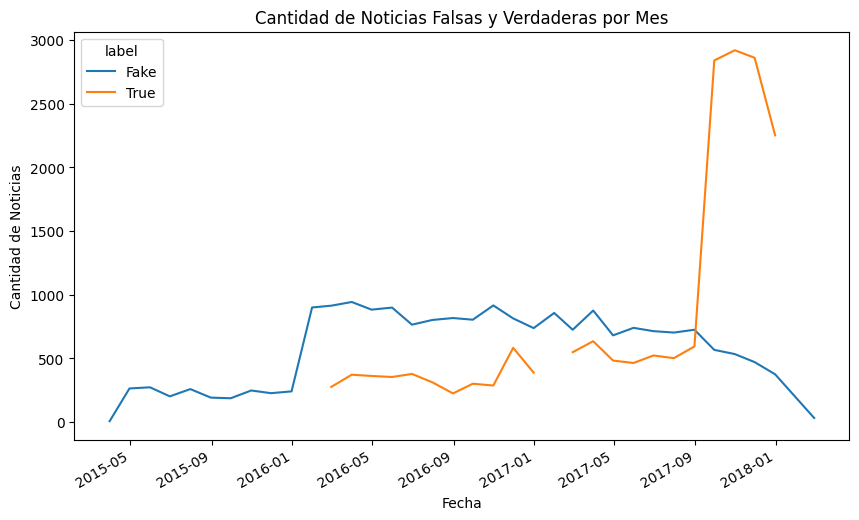


Explicación del resultado:
El DataFrame muestra la cantidad de noticias clasificadas como falsas y verdaderas por mes.
La columna 'date' representa los meses en los que se recopilaron las noticias.
La columna 'Fake' muestra la cantidad de noticias clasificadas como falsas para cada mes.
La columna 'True' muestra la cantidad de noticias clasificadas como verdaderas para cada mes.


In [ ]:
#VISUALIZACION DE DATOS DE ANALISIS TEMPORAL

import matplotlib.pyplot as plt

# Graficar la cantidad de noticias falsas y verdaderas por mes
monthly_counts.plot(kind='line', figsize=(10, 6))
plt.title('Cantidad de Noticias Falsas y Verdaderas por Mes')
plt.ylabel('Cantidad de Noticias')
plt.xlabel('Fecha')
plt.show()


# Imprimir una explicación del resultado
print("\nExplicación del resultado:")
print("El DataFrame muestra la cantidad de noticias clasificadas como falsas y verdaderas por mes.")
print("La columna 'date' representa los meses en los que se recopilaron las noticias.")
print("La columna 'Fake' muestra la cantidad de noticias clasificadas como falsas para cada mes.")
print("La columna 'True' muestra la cantidad de noticias clasificadas como verdaderas para cada mes.")



In [ ]:
import pandas as pd

# URL del archivo CSV
file_path = 'https://raw.githubusercontent.com/marialuz1982/M1000IA/main/IA%20FAKEXPERT/data/processed/combined_data_FINAL%20(3).csv'


# Mostrar las columnas del DataFrame
print("Columnas del DataFrame:")
print(data.columns)

Columnas del DataFrame:
Index(['title', 'text', 'agency', 'subject', 'date', 'label'], dtype='object')


3 -CREACION DE NUEVAS COLUMNAS PARA REALIZAR EDA- SENTIMENT, TOPIC, KEYWORDS





In [ ]:


import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from textblob import TextBlob
from gensim import corpora, models

# Descargar recursos de NLTK
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')


# Definir funciones para el procesamiento de texto
def extract_keywords(text):
    stop_words = set(stopwords.words('english'))
    word_tokens = word_tokenize(text.lower())
    filtered_words = [word for word in word_tokens if word.isalnum() and word not in stop_words]
    return filtered_words

def calculate_sentiment(text):
    blob = TextBlob(text)
    return blob.sentiment.polarity

def preprocess_text(text):
    lemmatizer = WordNetLemmatizer()
    stop_words = set(stopwords.words('english'))
    tokens = word_tokenize(text.lower())
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in tokens if token.isalnum() and token not in stop_words]
    return lemmatized_tokens

# Tokenización y preprocesamiento de texto
FakeXpert['preprocessed_text'] = FakeXpert['text'].apply(preprocess_text)

# Creación del diccionario de términos
dictionary = corpora.Dictionary(FakeXpert['preprocessed_text'])

# Creación de la matriz término-documento
corpus = [dictionary.doc2bow(text) for text in FakeXpert['preprocessed_text']]

# Entrenamiento del modelo LDA
lda_model = models.LdaModel(corpus, num_topics=10, id2word=dictionary, passes=15)

# Agregar columnas de palabras clave y sentimientos
FakeXpert['keywords'] = FakeXpert['text'].apply(lambda x: extract_keywords(x))
FakeXpert['sentiment'] = FakeXpert['text'].apply(lambda x: calculate_sentiment(x))

# Asignación de temas a los documentos
FakeXpert['topic'] = FakeXpert['preprocessed_text'].apply(lambda x: lda_model[dictionary.doc2bow(x)][0][0])

# Agregar columnas booleanas True/False basadas en la columna 'label'
FakeXpert['label_true'] = FakeXpert['label'].apply(lambda x: True if x == 'TRUE' else False)
FakeXpert['label_false'] = FakeXpert['label'].apply(lambda x: True if x == 'FALSE' else False)

# Visualización de los resultados
print(FakeXpert[['text', 'keywords', 'sentiment', 'topic', 'label_true', 'label_false']])


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


                                                    text  \
0      Anyone seeking a table at Carmines Italian res...   
1      Democrats from Pennsylvania's congressional de...   
2      In 2015, it wasn t the new breed of political ...   
3      Minnesota Governor Mark Dayton was released on...   
4      President Barack Obama is likely to discuss a ...   
...                                                  ...   
38751  Just one more reminder of why President Trump ...   
38752  The GOP presidential candidate who couldn t se...   
38753  According to The Hill, Democrat Senator Bob Ca...   
38754  If we protect every other government building ...   
38755  Ami Horowitz is fantastic! Check out this man ...   

                                                keywords  sentiment  topic  \
0      [anyone, seeking, table, carmines, italian, re...   0.061704      0   
1      [democrats, pennsylvania, congressional, deleg...   0.020000      0   
2      [2015, new, breed, political, groups, 

In [ ]:
# Imprimir los nombres de las columnas EXISTENTES EN EL DATASET
print(FakeXpert.columns)


Index(['title', 'text', 'agency', 'subject', 'date', 'label',
       'preprocessed_text', 'keywords', 'sentiment', 'topic', 'label_true',
       'label_false'],
      dtype='object')


colorear columnas sentiment, topic, keywords para mejor visualizacion

In [ ]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from textblob import TextBlob
from gensim import corpora, models
import random

# Descargar recursos de NLTK
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

file_path = 'https://raw.githubusercontent.com/marialuz1982/M1000IA/main/IA%20FAKEXPERT/data/processed/combined_data_FINAL%20(3).csv'


# Definir los códigos de formato de color ANSI
class colors:
    BLUE = '\033[94m'
    LIME = '\033[92m'
    YELLOW = '\033[93m'
    ENDC = '\033[0m'
    VIOLET = '\033[35m'
    RED = '\033[91m'


# Colorear las nuevas columnas 'topic', 'sentiment' y 'keywords' en todo el conjunto de datos
FakeXpert['colored_keywords'] = FakeXpert['keywords'].apply(lambda x: [colors.VIOLET + keywords + colors.ENDC for keywords in x])
FakeXpert['colored_sentiment'] = FakeXpert['sentiment'].apply(lambda x: colors.LIME + str(x) + colors.ENDC)
FakeXpert['colored_topic'] = FakeXpert['topic'].apply(lambda x: colors.RED + str(x) + colors.ENDC)

# Función para categorizar el sentimiento
def categorize_sentiment(sentiment_score):
    if sentiment_score > 0.2:
        return "Positive"
    elif sentiment_score < -0.2:
        return "Negative"
    else:
        return "Neutral"


# Seleccionar aleatoriamente 3 ejemplos para imprimir
sample_indices = random.sample(range(len(FakeXpert)), 3)
sample_test_data = FakeXpert.iloc[sample_indices]

# Imprimir los ejemplos seleccionados con las nuevas columnas coloreadas y el sentimiento categorizado
for _, row in sample_test_data.iterrows():
    colored_keywords = ' '.join(row['colored_keywords'])
    colored_text = row['text']
    colored_text += '\nKeywords: ' + colored_keywords
    colored_text += '\nSentiment: ' + colors.LIME + categorize_sentiment(row['sentiment']) + colors.ENDC
    colored_text += '\nTopic: ' + row['colored_topic']
    print(colored_text)


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Smith flies three flags in front of his house: the American flag, the POW flag, and the Navy flag. We supported Trump from when he started running for office, says Matthew s wife Brittany. We never made it public. We never had a sign in our backyard, so no one really knew we were pro Trump. But Matthew says he s been very active on Facebook, with posts supporting Trump, the Second Amendment, and other conservative causes. Investigators are looking into possible connections with arsonists. Earlier this month, anti-Trump graffiti was sprayed on two mobile homes near Mango. Investigators say someone tried to light one of them on fire. The Smiths, who have two young children, say times have been hard recently.Read more: FOX13
Keywords: smith flies three flags front house american flag pow flag navy flag supported trump started running office says matthew wife brittany never made public never sign backyard one really knew pro trump matthew says active facebook posts supporting trump second 

4- ANALISIS DE COLUMNA SENTIMENT

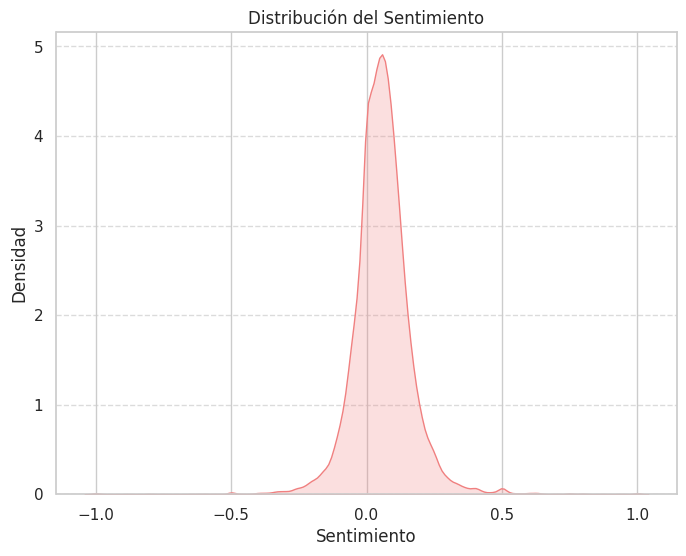

Estadísticas de la Distribución del Sentimiento:
Media del Sentimiento: 0.05665216744678093
Mediana del Sentimiento: 0.05404458720948083
Desviación Estándar del Sentimiento: 0.11031369534693088

El gráfico de densidad muestra la distribución del sentimiento en el conjunto de datos. La media del sentimiento es el punto central de la distribución, mientras que la mediana representa el valor medio. La desviación estándar indica la dispersión de los valores alrededor de la media. Observa cómo la densidad de los valores de sentimiento varía a lo largo del eje x, lo que puede indicar la presencia de diferentes tendencias emocionales en las noticias.
Análisis del Gráfico de Densidad del Sentimiento:
El gráfico muestra la distribución de los puntajes de sentimiento en el conjunto de datos de noticias.
Observaciones clave:
- La distribución es relativamente simétrica y centrada alrededor de un valor central.
- Hay una diversidad de sentimientos expresados en las noticias, con una cantidad signi

In [ ]:
#VISUALIZACION de columna sentimiento
import seaborn as sns
import matplotlib.pyplot as plt

# Configurar el estilo de seaborn
sns.set(style="whitegrid")

# Gráfico de densidad para la distribución del sentimiento
plt.figure(figsize=(8, 6))
sns.kdeplot(FakeXpert['sentiment'], color='lightcoral', fill=True)
plt.title('Distribución del Sentimiento')
plt.xlabel('Sentimiento')
plt.ylabel('Densidad')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Calcular estadísticas resumidas del sentimiento
sentimiento_mean = FakeXpert['sentiment'].mean()
sentimiento_median = FakeXpert['sentiment'].median()
sentimiento_std = FakeXpert['sentiment'].std()

# Imprimir el resultado y la explicación en texto
print("Estadísticas de la Distribución del Sentimiento:")
print("Media del Sentimiento:", sentimiento_mean)
print("Mediana del Sentimiento:", sentimiento_median)
print("Desviación Estándar del Sentimiento:", sentimiento_std)
print("\nEl gráfico de densidad muestra la distribución del sentimiento en el conjunto de datos. La media del sentimiento es el punto central de la distribución, mientras que la mediana representa el valor medio. La desviación estándar indica la dispersión de los valores alrededor de la media. Observa cómo la densidad de los valores de sentimiento varía a lo largo del eje x, lo que puede indicar la presencia de diferentes tendencias emocionales en las noticias.")


# Análisis del gráfico de densidad del sentimiento
print("Análisis del Gráfico de Densidad del Sentimiento:")
print("El gráfico muestra la distribución de los puntajes de sentimiento en el conjunto de datos de noticias.")
print("Observaciones clave:")
print("- La distribución es relativamente simétrica y centrada alrededor de un valor central.")
print("- Hay una diversidad de sentimientos expresados en las noticias, con una cantidad significativa de ellas teniendo puntajes de sentimiento cercanos a la neutralidad.")
print("- Observamos picos de densidad alrededor de ciertos valores de sentimiento, indicando una concentración de noticias con esos puntajes de sentimiento específicos.")
print("- La distribución tiene una amplitud moderada, sugiriendo cierta variabilidad en los puntajes de sentimiento en el conjunto de datos.")


In [ ]:
# Calcular la media del sentimiento para noticias falsas y verdaderas por separado
sentimiento_por_label = FakeXpert.groupby('label')['sentiment'].mean()

# Imprimir los resultados
print("Media del Sentimiento para Noticias Falsas y Verdaderas:")
print(sentimiento_por_label)


Media del Sentimiento para Noticias Falsas y Verdaderas:
label
Fake    0.061056
True    0.051811
Name: sentiment, dtype: float64


5- ANALISIS Y VISUALIZACION DE NOTICIAS FALSAS Y VERDADERAS


In [ ]:
# Verificar si hay suficientes noticias falsas y verdaderas en el conjunto de datos
if ((FakeXpert['label'] == 'Fake').sum() >= 5) and ((FakeXpert['label'] == 'True').sum() >= 5):
    # Obtener 5 ejemplos aleatorios de noticias falsas
    falsas_ejemplos = FakeXpert[FakeXpert['label'] == 'Fake'].sample(5)

    # Imprimir los ejemplos de noticias falsas
    print("Algunos ejemplos de noticias falsas:")
    for idx, row in falsas_ejemplos.iterrows():
        print("Título:", row['title'])
        print("Texto:", row['text'])
        print("Agencia:", row['agency'])
        print("-----------------------------------------------------------")

    # Obtener 5 ejemplos aleatorios de noticias verdaderas
    verdaderas_ejemplos = FakeXpert[FakeXpert['label'] == 'True'].sample(5)

    # Imprimir los ejemplos de noticias verdaderas
    print("\nAlgunos ejemplos de noticias verdaderas:")
    for idx, row in verdaderas_ejemplos.iterrows():
        print("Título:", row['title'])
        print("Texto:", row['text'])
        print("Agencia:", row['agency'])
        print("-----------------------------------------------------------")
else:
    print("No hay suficientes noticias falsas o verdaderas en el conjunto de datos para seleccionar aleatoriamente 5 ejemplos de cada tipo.")


Algunos ejemplos de noticias falsas:
Título:  Kushner: I Lied About Four Russian Contacts, But No Worries, I Didn't Collude
Texto: Donald Trump s son-in-law Jared Kushner has found himself at the focus of the Russia scandal which has gripped the administration. It s always the quiet ones you have to worry about, as they say. Kushner released an 11-page statement earlier in which he appeared to throw Donald Trump Jr. under the bus.Then Kush (I can call you Kush, right?) spoke for two hours in a closed-door session with Senate Intelligence Committee staff members investigating Russia s interference in the 2016 presidential election. After that, Kushner proceeded to talk to reporters, but didn t take any questions. I did not collude with Russia and I do not know of anyone else in the campaign who did so, Kushner said outside the White House.Kushner insisted that he has been fully transparent which is totally untrue, according to the written statement he issued just hours earlier.In that s

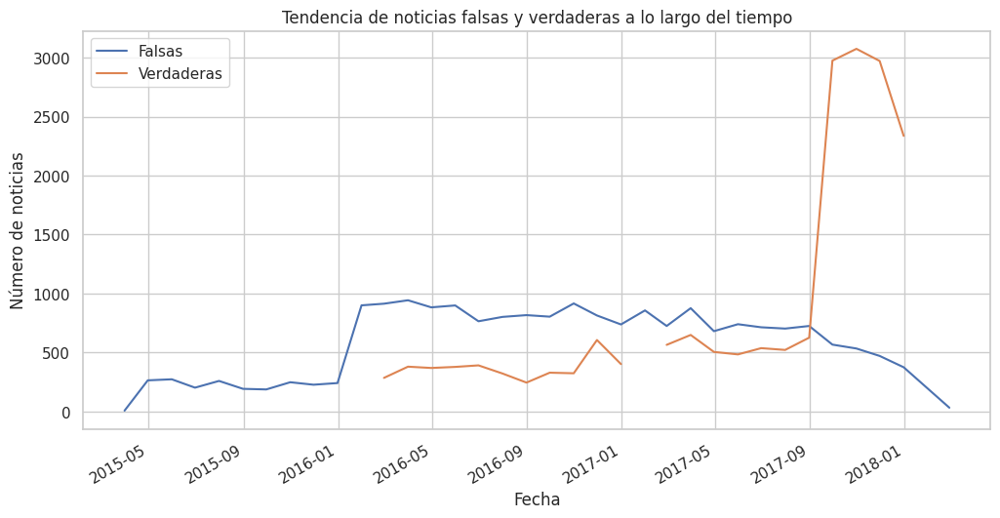

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Leer el archivo CSV
file_path = 'https://raw.githubusercontent.com/lagabyok/M1000-IA-FakeXpert/main/data/processed/combined_data.csv'
data = pd.read_csv(file_path, parse_dates=['date'])

# Establecer la columna de fecha como índice
data.set_index('date', inplace=True)

# Resample de los datos por mes y obtener el recuento de noticias falsas y verdaderas
monthly_counts = data.resample('M')['label'].value_counts().unstack()

# Visualización de tendencias a lo largo del tiempo
monthly_counts.plot(kind='line', figsize=(12, 6))
plt.title('Tendencia de noticias falsas y verdaderas a lo largo del tiempo')
plt.xlabel('Fecha')
plt.ylabel('Número de noticias')
plt.legend(['Falsas', 'Verdaderas'])
plt.show()




In [20]:
print("Estadísticas descriptivas de noticias etiquetadas:")
print(data['label'].describe())
print(data['label'].value_counts())





Estadísticas descriptivas de noticias etiquetadas:
count     38756
unique        2
top        Fake
freq      20295
Name: label, dtype: object
label
Fake    20295
True    18461
Name: count, dtype: int64


In [22]:
# Obtén el recuento total de noticias etiquetadas
total_count = data['label'].count()

# Obtén el recuento de noticias falsas y verdaderas
fake_count = data['label'].value_counts()['Fake']
true_count = data['label'].value_counts()['True']

# Calcula la media
media = true_count / total_count
print("Media:", media)

# Calcula la mediana
if fake_count > true_count:
    mediana = 'Fake'
elif fake_count < true_count:
    mediana = 'True'
else:
    mediana = 'Ambas etiquetas tienen la misma cantidad'
print("Mediana:", mediana)



Media: 0.47633914748684075
Mediana: Fake


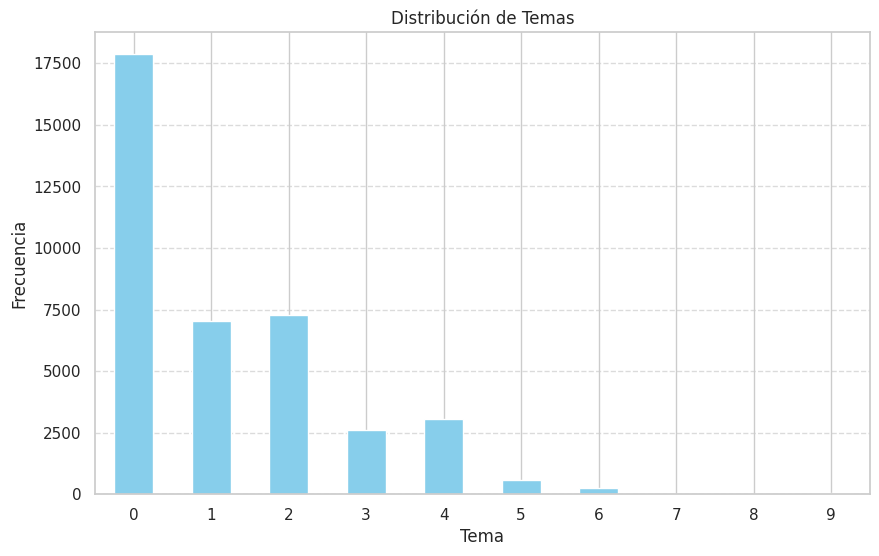

Distribución de Temas:
topic
0    17867
1     7047
2     7283
3     2606
4     3038
5      568
6      249
7       24
8       16
9       58
Name: count, dtype: int64
El gráfico de barras muestra la distribución de temas en el conjunto de datos de noticias.
Cada barra representa un tema específico, y la altura de la barra indica la frecuencia con la que ese tema aparece en las noticias.
El eje x muestra los diferentes temas, mientras que el eje y muestra la frecuencia de cada tema.
El gráfico proporciona una visualización clara de los temas más comunes en las noticias.


In [ ]:
import matplotlib.pyplot as plt

# Define una fuente alternativa
plt.rcParams['font.family'] = 'sans-serif'

# Calcular la frecuencia de cada tema
topic_counts = FakeXpert['topic'].value_counts().sort_index()

# Crear el gráfico de barras
plt.figure(figsize=(10, 6))
topic_counts.plot(kind='bar', color='skyblue')
plt.title('Distribución de Temas')
plt.xlabel('Tema')
plt.ylabel('Frecuencia')
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

# Imprimir los resultados en texto
print("Distribución de Temas:")
print(topic_counts)


# Explicación del gráfico
print("El gráfico de barras muestra la distribución de temas en el conjunto de datos de noticias.")
print("Cada barra representa un tema específico, y la altura de la barra indica la frecuencia con la que ese tema aparece en las noticias.")
print("El eje x muestra los diferentes temas, mientras que el eje y muestra la frecuencia de cada tema.")
print("El gráfico proporciona una visualización clara de los temas más comunes en las noticias.")


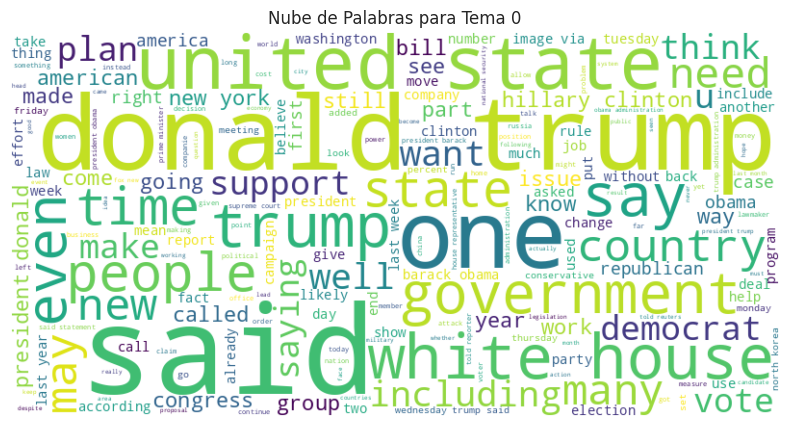

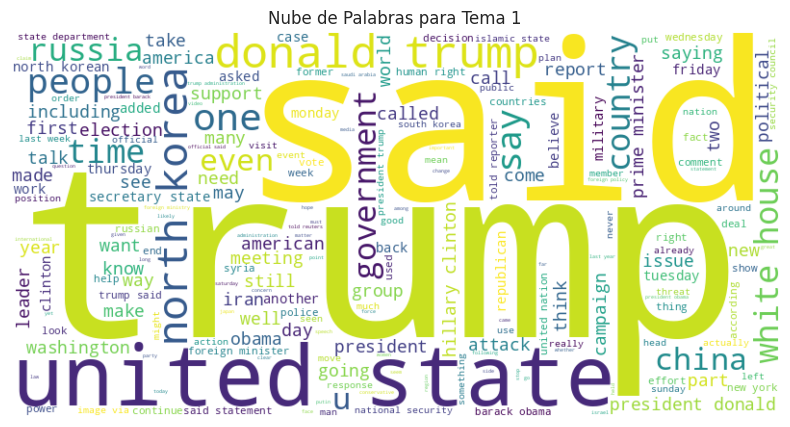

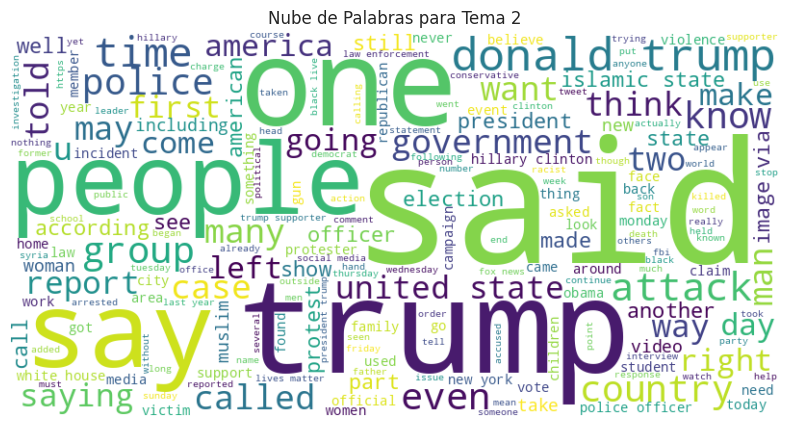

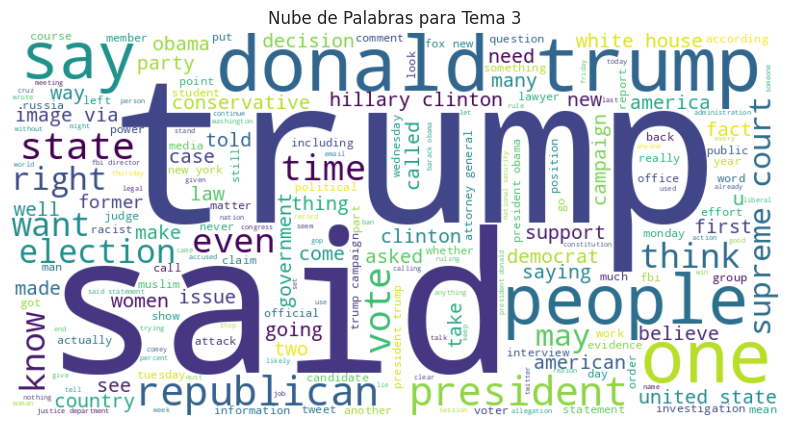

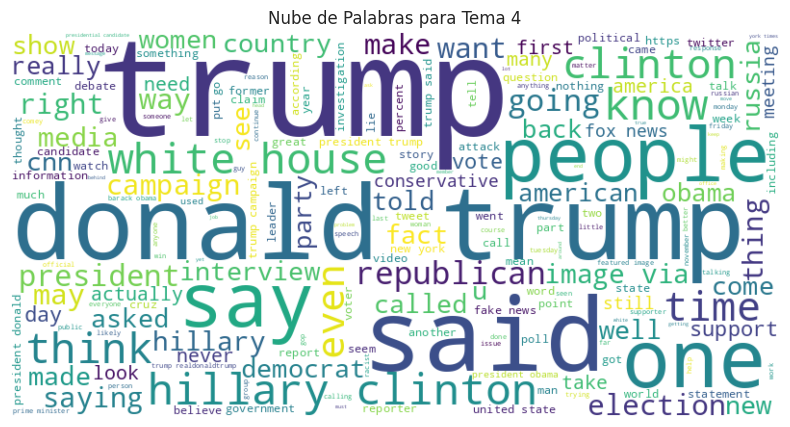

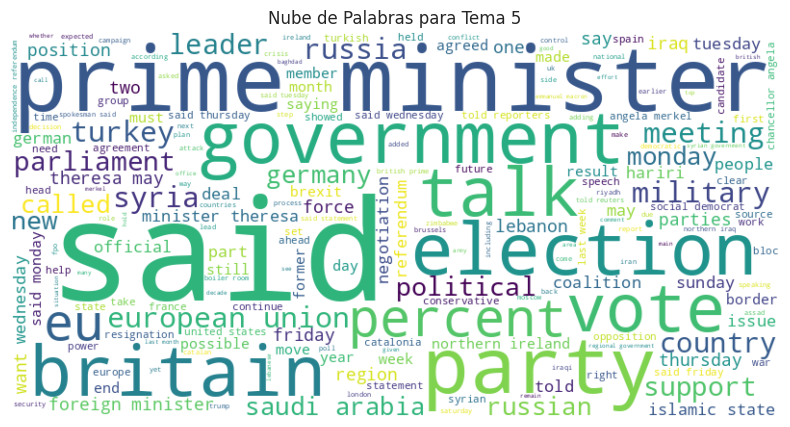

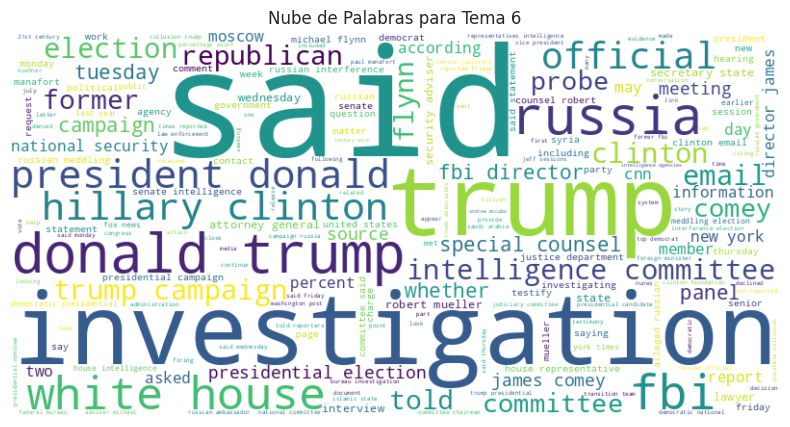

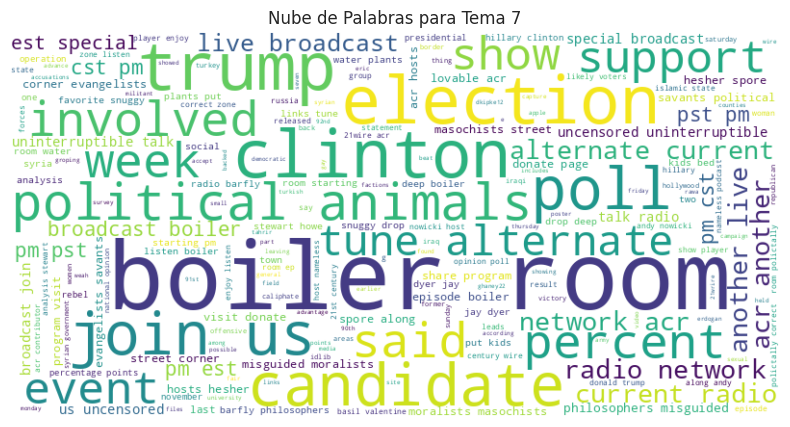

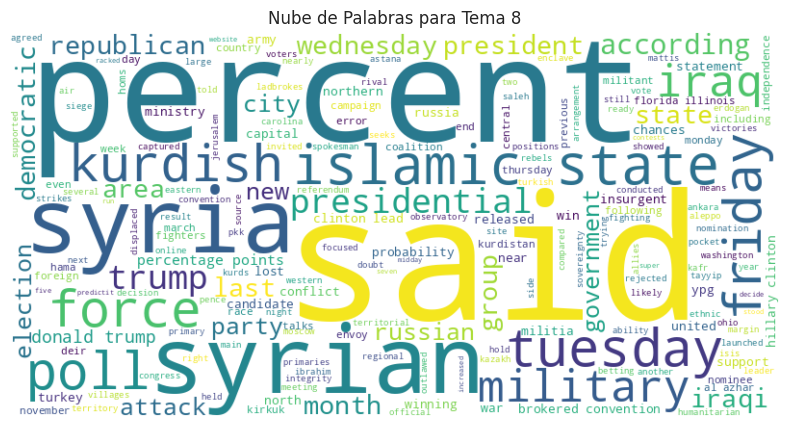

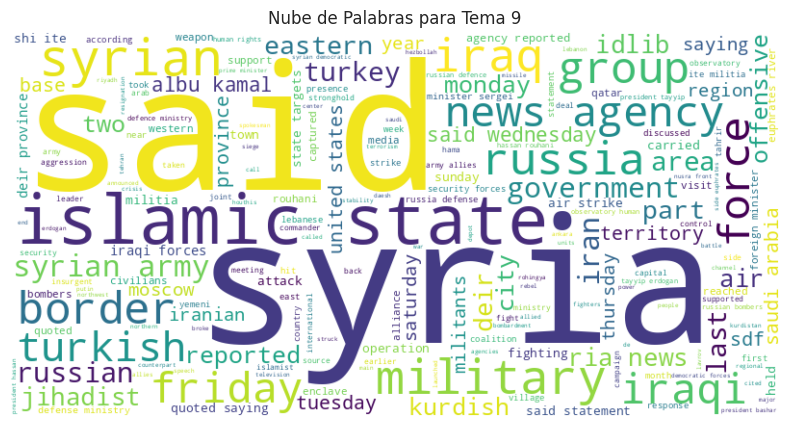

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Función para generar nube de palabras por tema
def generate_wordcloud(topic_id):
    text = ' '.join(FakeXpert[FakeXpert['topic'] == topic_id]['keywords'].sum())
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Nube de Palabras para Tema {topic_id}')
    plt.axis('off')
    plt.show()

topic_counts = FakeXpert['topic'].value_counts()

# Ordenar los índices de los recuentos de temas
sorted_topic_ids = topic_counts.index.sort_values()

# Generar nube de palabras para cada tema en orden
for topic_id in sorted_topic_ids:
    generate_wordcloud(topic_id)

In [ ]:
from collections import Counter

# Función para contar palabras en el texto
def count_words(text):
    word_counts = Counter(text.split())
    return word_counts

topic_counts = FakeXpert['topic'].value_counts()

# Contar palabras en el texto de cada nube de palabras
for topic_id in topic_counts.index:
    text = ' '.join(FakeXpert[FakeXpert['topic'] == topic_id]['keywords'].sum())
    word_counts = count_words(text)

    num_words = len(word_counts)

    print(f'Nube {topic_id}: {num_words} palabras')
    print("Palabras en la nube de palabras:")
    for word, count in word_counts.items():
        print(f"{word}: {count}", end="  |  ")  # Separar palabras y frecuencias con un pipe (|)
    print("\n")  # Añade una línea en blanco después de cada nube de palabras

Nube 0: 61371 palabras
Palabras en la nube de palabras:
democrats: 2882  |  pennsylvania: 355  |  congressional: 1536  |  delegation: 104  |  sent: 1685  |  letter: 2065  |  federal: 4198  |  rail: 39  |  regulator: 138  |  monday: 2470  |  raising: 313  |  concerns: 1131  |  possible: 1645  |  negative: 463  |  impacts: 37  |  merger: 84  |  canadian: 291  |  pacific: 198  |  norfolk: 11  |  southern: 431  |  surface: 108  |  transportation: 165  |  board: 1002  |  raised: 960  |  impact: 587  |  could: 7267  |  railroad: 16  |  jobs: 1103  |  said: 35685  |  lead: 1234  |  disinvestment: 1  |  infrastructure: 344  |  state: 10106  |  senator: 2542  |  bob: 299  |  casey: 27  |  five: 1072  |  members: 2434  |  house: 9249  |  representatives: 1078  |  also: 10437  |  wrote: 2034  |  deeply: 327  |  concerned: 772  |  voting: 1108  |  trust: 552  |  structure: 123  |  proposed: 659  |  bid: 380  |  4: 904  |  company: 2538  |  disclosed: 315  |  28: 470  |  billion: 1449  |  offer: 49

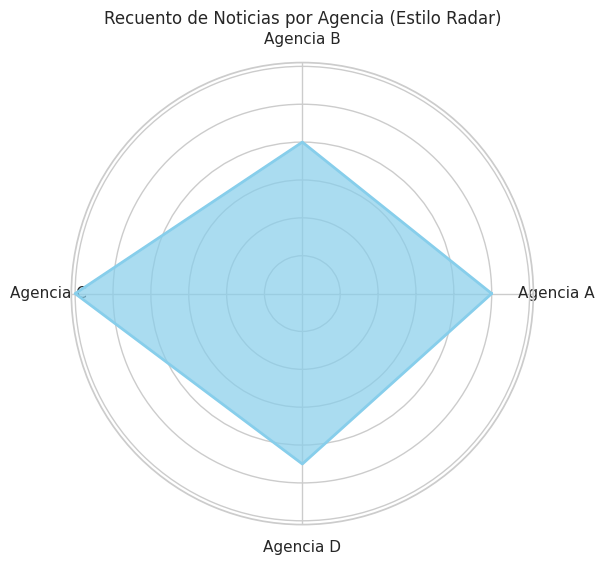

Recuento de Noticias por Agencia:
Agencia A: 100
Agencia B: 80
Agencia C: 120
Agencia D: 90


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Configurar la fuente
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = ['DejaVu Sans']

# Crear datos de ejemplo
agencias = ['Agencia A', 'Agencia B', 'Agencia C', 'Agencia D']
recuento_noticias = [100, 80, 120, 90]  # Recuento de noticias por agencia

# Calcular los ángulos para el gráfico radar
angulos = np.linspace(0, 2 * np.pi, len(agencias), endpoint=False).tolist()

# Completar el círculo
recuento_noticias += recuento_noticias[:1]
angulos += angulos[:1]

# Crear el gráfico radar
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))
ax.fill(angulos, recuento_noticias, color='skyblue', alpha=0.7)
ax.plot(angulos, recuento_noticias, color='skyblue', linewidth=2)

# Etiquetas en el eje radial
ax.set_yticklabels([])

# Etiquetas de agencias
ax.set_xticks(angulos[:-1])
ax.set_xticklabels(agencias)

# Añadir título
plt.title('Recuento de Noticias por Agencia (Estilo Radar)')

# Mostrar el gráfico
plt.show()

# Resultado en texto
print("Recuento de Noticias por Agencia:")
for agencia, recuento in zip(agencias, recuento_noticias[:-1]):
    print(f"{agencia}: {recuento}")


VALORES ATIPICOS


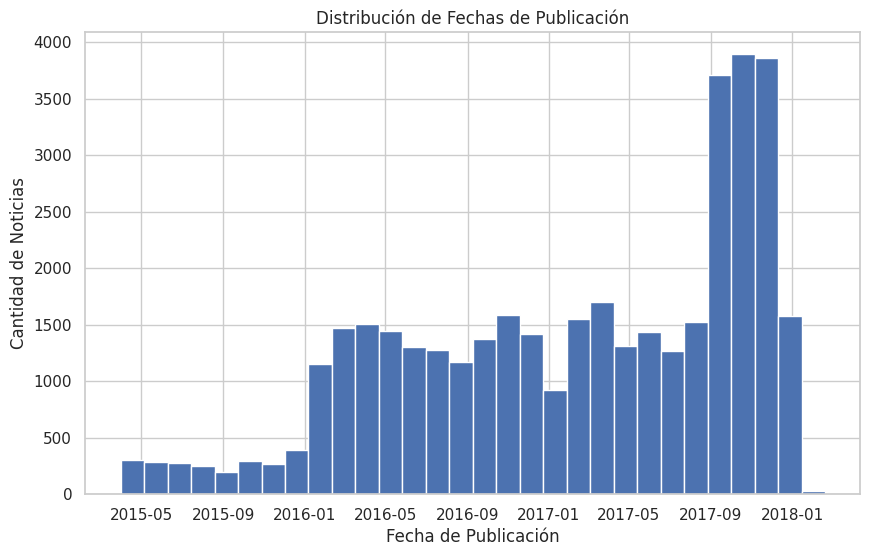

Valores atípicos en la fecha de publicación:
                                                   title  \
18461  HILLARY RODHAM NIXON: A CANDIDATE WITH MORE BA...   
18462  WATCH DIRTY HARRY REID ON HIS LIE ABOUT ROMNEY...   
18463  APPLE'S CEO SAYS RELIGIOUS FREEDOM LAWS ARE "˜...   
18464  BENGHAZI PANEL CALLS HILLARY TO TESTIFY UNDER ...   
18465  HILLARY RODHAM NIXON: A CANDIDATE WITH MORE BA...   
...                                                  ...   
19753  TRUMP GETS HAMMERED [Video] For Not Condemning...   
19754  #BlackLivesMatter Terrorists Using #BlackRail ...   
19755  MUSLIM CLOCK BOY'S LIE EXPOSED [Video] Expert ...   
19756  #BlackLivesMatter Terrorists Using #BlackRail ...   
19757  MUSLIM CLOCK BOY'S LIE EXPOSED [Video] Expert ...   

                                                    text     agency  \
18461  The irony here isn t lost on us. Hillary is be...  NO AGENCY   
18462  In case you missed it Sen. Harry Reid (R-NV), ...  NO AGENCY   
18463  The gay mafia 

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Convertir la columna 'date' a tipo datetime
FakeXpert['date'] = pd.to_datetime(FakeXpert['date'])

# Crear el gráfico de histograma para la distribución de fechas de publicación
plt.figure(figsize=(10, 6))
FakeXpert['date'].hist(bins=30)
plt.title('Distribución de Fechas de Publicación')
plt.xlabel('Fecha de Publicación')
plt.ylabel('Cantidad de Noticias')
plt.show()

# Calcular media y desviación estándar
mean_date = FakeXpert['date'].mean()
std_date = FakeXpert['date'].std()

# Definir límites para valores atípicos
lower_limit = mean_date - 2 * std_date
upper_limit = mean_date + 2 * std_date

# Identificar valores atípicos
outliers = FakeXpert[(FakeXpert['date'] < lower_limit) | (FakeXpert['date'] > upper_limit)]

# Imprimir resultados en formato texto
print("Valores atípicos en la fecha de publicación:")
print(outliers)


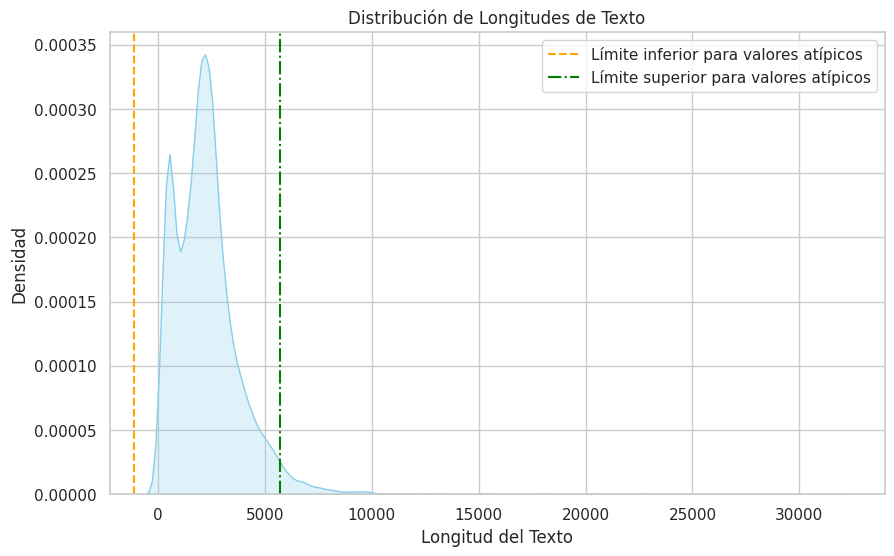

Valores atípicos en la longitud de texto:
                                                   title  \
0      The frequent-flyer U.S. Congress: lawmakers wo...   
128    Foreclosure crisis snarls Clinton Sanders' eff...   
269    Sanders supporters' courtship of Clinton super...   
278    Trump's low advertising spending weighs on U.S...   
287    Wall Street's big short: President Donald J. T...   
...                                                  ...   
38712  BILL NYE The FAKE Science Guy THREATENS Conser...   
38717  "˜Classified' Emails from Hillary Clinton and ...   
38718  "˜Classified' Emails from Hillary Clinton and ...   
38723  PRESIDENT TRUMP TWEETS The Perfect New Years M...   
38748  GOTCHA! A Stammering John Podesta Stunned by a...   

                                                    text  \
0      Anyone seeking a table at Carmines Italian res...   
128    Democratic presidential hopefuls Bernie Sander...   
269    Backers of Democratic presidential contender B... 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Sentimiento: 0.06229482323232322
Tema: 2
Etiqueta verdadera: False
Etiqueta falsa: False
Palabras clave coloreadas: ['\x1bspanish\x1b', '\x1bgovernment\x1b', '\x1bready\x1b', '\x1btake\x1b', '\x1brunning\x1b', '\x1bcatalonia\x1b', '\x1bfriday\x1b', '\x1bloyalty\x1b', '\x1blocal\x1b', '\x1bpolice\x1b', '\x1bmadrid\x1b', '\x1bcatalan\x1b', '\x1bcause\x1b', '\x1btested\x1b', '\x1bordered\x1b', '\x1bdrag\x1b', '\x1bformer\x1b', '\x1bpolitical\x1b', '\x1bmasters\x1b', '\x1boffice\x1b', '\x1bspanish\x1b', '\x1bpolice\x1b', '\x1bprovoked\x1b', '\x1binternational\x1b', '\x1boutcry\x1b', '\x1busing\x1b', '\x1bbatons\x1b', '\x1brubber\x1b', '\x1bbullets\x1b', '\x1bstepped\x1b', '\x1btry\x1b', '\x1bstop\x1b', '\x1billegal\x1b', '\x1bindependence\x1b', '\x1breferendum\x1b', '\x1b1\x1b', '\x1blocal\x1b', '\x1bcatalan\x1b', '\x1bforce\x1b', '\x1brefused\x1b', '\x1bprevent\x1b', '\x1bvoting\x1b', '\x1bbecome\x1b', '\x1bworst\x1b', '\x1bconstitutional\x1b', '\x1bcrisis\x1b', '\x1bmodern\x1b', '\x1bspa

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Texto: Bruno Guigue 21st Century WirePurveyor of platitudes, the West portrays itself as the epitome of universal values . A paragon of democracy, this champion of human rights always deploys its presumed virtues in support of its hegemonic ambitions. Like the Fairy Godmother, doing her best to match her morals with her interests, she veils her ambitions with the cloak of Law and Justice. Thus, the Free World goes about bombing foreign nations for the sake of democracy , preferably in oil or mineral-rich territories. By combining a simple creed with capitalist greed, it is acting as if it can convert its economic supremacy into moral privilege.The rest of the world is not fooled by these tactics, but who cares? The Free World is always right because it represents the good fight and for as long as it is the most powerful, it will not be contradicted. The inherent barbarism that it projects onto others is the counter to its self-proclaimed monopoly on civilization .Sanctified by the hol

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calcular la longitud de los textos
FakeXpert['text_length'] = FakeXpert['text'].apply(len)

# Configurar el estilo de los gráficos
sns.set(style="whitegrid")

# Crear el gráfico de densidad
plt.figure(figsize=(10, 6))
sns.kdeplot(FakeXpert['text_length'], fill=True, color="skyblue")
plt.title('Distribución de Longitudes de Texto')
plt.xlabel('Longitud del Texto')
plt.ylabel('Densidad')

# Añadir líneas para los límites de valores atípicos
mean_length = FakeXpert['text_length'].mean()
std_length = FakeXpert['text_length'].std()
lower_limit = mean_length - 2 * std_length
upper_limit = mean_length + 2 * std_length

plt.axvline(x=lower_limit, color='orange', linestyle='--', label='Límite inferior para valores atípicos')
plt.axvline(x=upper_limit, color='green', linestyle='-.', label='Límite superior para valores atípicos')

plt.legend()
plt.show()

# Identificar valores atípicos

outliers = FakeXpert[(FakeXpert['text_length'] < lower_limit) | (FakeXpert['text_length'] > upper_limit)]
print("Valores atípicos en la longitud de texto:")
print(outliers)

# Presentación organizada de los resultados
for index, row in outliers.iterrows():
    print(f"\nÍndice ({index}):")
    print(f"Título: {row['title']}")
    print(f"Texto: {row['text']}")
    print(f"Agencia: {row['agency']}")
    print(f"Tema: {row['subject']}")
    print(f"Fecha: {row['date']}")
    print(f"Etiqueta: {row['label']}")
    print(f"Texto preprocesado: {row['preprocessed_text']}")
    print(f"Palabras clave: {row['keywords']}")
    print(f"Sentimiento: {row['sentiment']}")
    print(f"Tema: {row['topic']}")
    print(f"Etiqueta verdadera: {row['label_true']}")
    print(f"Etiqueta falsa: {row['label_false']}")
    print(f"Palabras clave coloreadas: {row['colored_keywords']}")
    print(f"Sentimiento coloreado: {row['colored_sentiment']}")
    print(f"Tema coloreado: {row['colored_topic']}")
    print(f"Longitud del texto: {row['text_length']}")



In [3]:
import pandas as pd

# URL del archivo CSV
file_path = 'https://raw.githubusercontent.com/marialuz1982/M1000IA/main/IA%20FAKEXPERT/data/processed/combined_data_FINAL%20(3).csv'

# Intenta leer el archivo CSV con varios delimitadores
try:
    # Intenta con coma como delimitador
    data = pd.read_csv(file_path, delimiter=',')
except pd.errors.ParserError:
    try:
        # Intenta con punto y coma como delimitador
        data = pd.read_csv(file_path, delimiter=';')
    except pd.errors.ParserError:
        try:
            # Intenta con tabulación como delimitador
            data = pd.read_csv(file_path, delimiter='\t')
        except pd.errors.ParserError:
            try:
                # Intenta con espacio en blanco como delimitador
                data = pd.read_csv(file_path, delimiter=' ')
            except pd.errors.ParserError:
                print("No se pudo leer el archivo CSV con ninguno de los delimitadores especificados.")

# Verificar el conteo de noticias falsas y verdaderas
conteo_etiquetas = data['label'].value_counts()
print(conteo_etiquetas)

label
Fake    20295
True    18461
Name: count, dtype: int64


In [14]:
print("Estadísticas descriptivas de noticias etiquetadas:")
print(data['label'].describe())
print(data['label'].value_counts())





Estadísticas descriptivas de noticias etiquetadas:
count     38756
unique        2
top        Fake
freq      20295
Name: label, dtype: object
label
Fake    20295
True    18461
Name: count, dtype: int64
